In [52]:
import jsonlines
import pandas as pd

with jsonlines.open('Dataset/SMHD/SMHD_eating_train.jsonl') as reader:
    count=0
    df_train = pd.DataFrame()
    for obj in reader:
        count=count+1
        lines = reader.read()
        df_inter=pd.json_normalize(lines, record_path=['posts'], meta=['id', 'label'])
        df_train=pd.concat([df_train,df_inter], axis=0)
        
with jsonlines.open('Dataset/SMHD/SMHD_eating_test.jsonl') as reader:
    count=0
    df_test = pd.DataFrame()
    for obj in reader:
        count=count+1
        lines = reader.read()
        df_inter=pd.json_normalize(lines, record_path=['posts'], meta=['id', 'label'])
        df_test=pd.concat([df_test,df_inter], axis=0)

with jsonlines.open('Dataset/SMHD/SMHD_eating_dev.jsonl') as reader:
    count=0
    df_dev = pd.DataFrame()
    for obj in reader:
        count=count+1
        lines = reader.read()
        df_inter=pd.json_normalize(lines, record_path=['posts'], meta=['id', 'label'])
        df_dev=pd.concat([df_dev,df_inter], axis=0)

In [53]:
data = pd.concat([df_train, df_test, df_dev])

In [55]:
data[(data.label == 1)].sum()

/tmp/ipykernel_4642/852992004.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data[(data.label == 1)].sum()


created_utc                                       37965632942785
text           Added :)Added :)I lost 80lbs after moving out ...
id             2003202200320220032022003202200320220032022003...
label                                                      26295
dtype: object

In [62]:
data[data["label"]==1 ].count()

body           24014
created_utc    26295
text           26295
selftext        2281
title           2281
id             26295
label          26295
dtype: int64

In [74]:
data.drop(['selftext', 'body', 'created_utc', 'title'], axis=1, inplace=True)

In [77]:
test=data.groupby(['id', 'label']).text.apply(list).reset_index()


In [83]:
test['length']=test['text'].str.len()

In [86]:
test

,id,label,text,length
0,1009120,1,[A decent salad at a non-chain restaurant. No ...,56
1,1017198,0,"[disagree. blue shirt. :), this is adorable,...",118
2,1040912,1,[You are my idol! It means so much to hear thi...,82
3,1067975,0,"[, Nice picture of it while she was still inta...",164
4,1073170,1,"[, https://en.m.wikipedia.org/wiki/Pietà_(Mich...",64
...,...,...,...,...
326,9876577,1,"[Get a pumice stone, keep it in the shower and...",194
327,9894073,0,"[, , , , The warning on Q-tips that says not t...",302
328,9954367,1,"[""Sticks and stone may break my bones, but wor...",270
329,9956553,1,[Yeah i knew it wasent entirely about the game...,108


In [88]:
test[test["label"]==1 ].mean()["length"]

/tmp/ipykernel_4642/1778797450.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  test[test["label"]==1 ].mean()["length"]


159.36363636363637

In [89]:
test[test["label"]==0 ].mean()["length"]

/tmp/ipykernel_4642/622255921.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  test[test["label"]==0 ].mean()["length"]


300.65060240963857

In [4]:
data.head()

,body,created_utc,text,selftext,title,id,label
0,Added :),1407627843,Added :),NaN,NaN,2003202,1
1,Added :),1407627874,Added :),NaN,NaN,2003202,1
2,I lost 80lbs after moving out of my parents ho...,1407628386,I lost 80lbs after moving out of my parents ho...,NaN,NaN,2003202,1
3,I tried adding you again. Let me know if it wo...,1407631337,I tried adding you again. Let me know if it wo...,NaN,NaN,2003202,1
4,Added!,1407631412,Added!,NaN,NaN,2003202,1


In [5]:
len(data['id'].unique())

331

In [49]:
print(data['label'].value_counts())

0    49908
1    26295
Name: label, dtype: int64


In [51]:
26295/(49908+26295)

0.3450651549151608

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76203 entries, 0 to 501
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   body         67037 non-null  object
 1   created_utc  76203 non-null  int64 
 2   text         76203 non-null  object
 3   selftext     9166 non-null   object
 4   title        9166 non-null   object
 5   id           76203 non-null  object
 6   label        76203 non-null  object
dtypes: int64(1), object(6)
memory usage: 4.7+ MB


In [7]:
data["label"] = pd.to_numeric(data["label"])

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76203 entries, 0 to 501
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   body         67037 non-null  object
 1   created_utc  76203 non-null  int64 
 2   text         76203 non-null  object
 3   selftext     9166 non-null   object
 4   title        9166 non-null   object
 5   id           76203 non-null  object
 6   label        76203 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 4.7+ MB


In [63]:
import numpy as np
data["n_words"] = data["text"].apply(lambda x: len(x))

In [64]:
data.describe()

,created_utc,n_words
count,7.620300e+04,76203.000000
mean,1.441609e+09,161.129457
std,5.741126e+07,282.799671
min,1.209329e+09,0.000000
25%,1.407560e+09,29.000000
50%,1.453987e+09,78.000000
75%,1.490175e+09,184.000000
max,1.514764e+09,12388.000000


In [65]:
data

,body,created_utc,text,selftext,title,id,label,n_words
0,Added :),1407627843,Added :),NaN,NaN,2003202,1,8
1,Added :),1407627874,Added :),NaN,NaN,2003202,1,8
2,I lost 80lbs after moving out of my parents ho...,1407628386,I lost 80lbs after moving out of my parents ho...,NaN,NaN,2003202,1,178
3,I tried adding you again. Let me know if it wo...,1407631337,I tried adding you again. Let me know if it wo...,NaN,NaN,2003202,1,51
4,Added!,1407631412,Added!,NaN,NaN,2003202,1,6
...,...,...,...,...,...,...,...,...
497,Thanks,1497903219,Thanks,NaN,NaN,1455910,0,6
498,NaN,1499716895,[removed],[removed],[H] 1 overdrive crate [W] 1 key or offer,1455910,0,9
499,Woooosh,1509054376,Woooosh,NaN,NaN,1455910,0,7
500,Ipad air 2 - 9.0.1 jailbreak. Should I update?...,1512535842,Ipad air 2 - 9.0.1 jailbreak. Should I update?...,NaN,NaN,1455910,0,109


In [66]:
data[data["label"]==1 ].sum()["n_words"]

/tmp/ipykernel_4642/4129281215.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data[data["label"]==1 ].sum()["n_words"]


5829847

In [67]:
data[data["label"]==0 ].sum()["n_words"]

/tmp/ipykernel_4642/3037195576.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data[data["label"]==0 ].sum()["n_words"]


6448701

In [69]:
data[data["label"]==1 ].mean()["n_words"]

/tmp/ipykernel_4642/3168200947.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data[data["label"]==1 ].mean()["n_words"]


221.70933637573683

In [70]:
data[data["label"]==0 ].mean()["n_words"]

/tmp/ipykernel_4642/1209127561.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  data[data["label"]==0 ].mean()["n_words"]


129.21176965616735

In [12]:
data["n_words"].max()

12388

In [13]:
data_grouped=data.groupby(['id', 'label']).text.apply(list).transform(lambda x : ' '.join(x)).reset_index()
data_grouped.head()

,id,label,text
0,1009120,1,A decent salad at a non-chain restaurant. No d...
1,1017198,0,"disagree. blue shirt. :) this is adorable, s..."
2,1040912,1,You are my idol! It means so much to hear this...
3,1067975,0,Nice picture of it while she was still intact...
4,1073170,1,https://en.m.wikipedia.org/wiki/Pietà_(Michel...


In [14]:
data_grouped.shape

(331, 3)

In [15]:
data_wordcloud = data['text'].str.cat(sep=' ')
data_wordcloud

'Added :) Added :) I lost 80lbs after moving out of my parents house (mostly because I couldn\'t afford food), but it is easier because you have control over what types of food come into your home.  I tried adding you again. Let me know if it worked. Added! Hmmm... That\'s odd. I just logged off and logged back on. Hopefully that helped. My account is still up and working. Not sure why it\'s doing that.  Added! Please let me know if it worked, apparently I am having trouble adding people.  Added. Let me know if it worked. I seem to be having trouble adding people.  I was looking through the settings. I don\'t see anything that could lead to difficulty adding people. Looking through FAQs. Might find something on there. That\'s really disappointing. I think I will email them and try and get this fixed. :( I tried adding you. I hope it worked. Apparently I am having issues adding people. Added. Im having some trouble adding people so let me know if it worked. I emailed mfp to let them kno

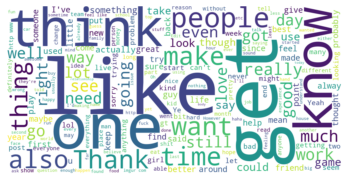

In [16]:
from wordcloud import WordCloud

import nltk
from nltk.corpus import stopwords
import matplotlib.pyplot as plt

stopwords = nltk.corpus.stopwords.words('english')
newStopWords = ['I\'m','would']
stopwords.extend(newStopWords)


# Create and generate a word cloud image:
wordcloud = WordCloud(stopwords=stopwords, background_color='white', width=1200, height=600).generate(data_wordcloud)

wordcloud.to_file('wordcloud.png')
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [26]:
import scattertext as st
data_grouped['parse'] = data_grouped['text'].apply(st.whitespace_nlp_with_sentences)

In [33]:
data_grouped['label_str'] = data_grouped['label'].apply(str)
data_grouped

,id,label,text,text_parse,parse,label_str
0,1009120,1,A decent salad at a non-chain restaurant. No d...,"(a, decent, salad, at, a, non, -, chain, resta...","(a, decent, salad, at, a, non, -, chain, resta...",1
1,1017198,0,"disagree. blue shirt. :) this is adorable, s...","(disagree, ., blue, shirt, ., :, ), this, is, ...","(disagree, ., blue, shirt, ., :, ), this, is, ...",0
2,1040912,1,You are my idol! It means so much to hear this...,"(you, are, my, idol, !, it, means, so, much, t...","(you, are, my, idol, !, it, means, so, much, t...",1
3,1067975,0,Nice picture of it while she was still intact...,"(nice, picture, of, it, while, she, was, still...","(nice, picture, of, it, while, she, was, still...",0
4,1073170,1,https://en.m.wikipedia.org/wiki/Pietà_(Michel...,"(https, :, /, /, en, ., m, ., wikipedia, ., or...","(https, :, /, /, en, ., m, ., wikipedia, ., or...",1
...,...,...,...,...,...,...
326,9876577,1,"Get a pumice stone, keep it in the shower and ...","(get, a, pumice, stone, ,, keep, it, in, the, ...","(get, a, pumice, stone, ,, keep, it, in, the, ...",1
327,9894073,0,The warning on Q-tips that says not to put...,"(the, warning, on, q, -, tips, that, says, not...","(the, warning, on, q, -, tips, that, says, not...",0
328,9954367,1,"""Sticks and stone may break my bones, but word...","("", sticks, and, stone, may, break, my, bones,...","("", sticks, and, stone, may, break, my, bones,...",1
329,9956553,1,Yeah i knew it wasent entirely about the games...,"(yeah, i, knew, it, wasent, entirely, about, t...","(yeah, i, knew, it, wasent, entirely, about, t...",1


In [37]:
import scattertext as st


df = st.SampleCorpora.ConventionData2012.get_data().assign(
    parse=lambda df: df.text.apply(st.whitespace_nlp_with_sentences)
)

corpus = st.CorpusFromParsedDocuments(
    data_grouped, category_col='label_str', parsed_col='parse'
).build().get_unigram_corpus().compact(st.AssociationCompactor(2000))

html = st.produce_scattertext_explorer(
    corpus,
    category='1', category_name='EDs', not_category_name='NoEDs',
    minimum_term_frequency=0, pmi_threshold_coefficient=0,
    width_in_pixels=1000, metadata=corpus.get_df()['id'],
    transform=st.Scalers.dense_rank
)
open('./demo_compact.html', 'w').write(html)

13469408

In [38]:
html2 = st.produce_scattertext_explorer(corpus,
        category='1',
          category_name='EDs',
          not_category_name='NoEDs',
          width_in_pixels=1000,
          metadata=corpus.get_df()['id'])

open("Convention-Visualization.html", 'wb').write(html2.encode('utf-8'))

13472873

In [45]:
feat_builder = st.FeatsFromOnlyEmpath()
empath_corpus = st.CorpusFromParsedDocuments(data_grouped,
                                             category_col='label_str',
                                             feats_from_spacy_doc=feat_builder,
                                             parsed_col='parse').build()

html3 = st.produce_scattertext_explorer(empath_corpus,
                                        category='1',
                                        category_name='EDs',
                                        not_category_name='NoEDs',
                                        width_in_pixels=1000,
                                        metadata=empath_corpus.get_df()['id'],
                                        use_non_text_features=True,
                                        use_full_doc=True,
                                        topic_model_term_lists=feat_builder.get_top_model_term_lists())

open("Convention-Visualization-Empath.html", 'wb').write(html3.encode('utf-8'))

13913002